# Data Preprocessing

In [1]:
import pandas as pd
import numpy as np

booking_data = pd.read_csv(r"Fin-A-Lytics\12month_flight_booking.csv")
revenue_data = pd.read_csv(r"Fin-A-Lytics\12months_flight_revenue.csv")
booking_prediction_data = pd.read_csv(r"Fin-A-Lytics\3months_flight_booking_prediction.csv")
revenue_prediction_data = pd.read_csv(r"Fin-A-Lytics\3months_flight_revenue_prediction.csv")
schedule_data = pd.read_csv(r"Fin-A-Lytics\Schedule data.csv")
market_data=pd.read_csv(r"Fin-A-Lytics\Market data.csv")

In [2]:
import warnings
warnings.filterwarnings("ignore")

In [3]:
booking_data.describe(include=['number', 'object'])

,Unnamed: 0,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date,Dep_time,...,Class RDay Res Hold Total RDay: 9,Class RDay Res Hold Total RDay: 8,Class RDay Res Hold Total RDay: 7,Class RDay Res Hold Total RDay: 6,Class RDay Res Hold Total RDay: 5,Class RDay Res Hold Total RDay: 4,Class RDay Res Hold Total RDay: 3,Class RDay Res Hold Total RDay: 2,Class RDay Res Hold Total RDay: 1,Class RDay Res Hold Total RDay: 0
count,195774.000000,195774,195774,195774,195774,195774.000000,195774,195774.000000,195774,195774,...,195466.000000,195476.000000,195486.000000,195508.000000,195522.000000,195542.000000,195560.000000,195575.000000,194555.000000,195774.000000
unique,NaN,5,5,2,26,NaN,1,NaN,328,83,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,BBB,DDD,Y,K,NaN,AA,NaN,2023-05-26,12:55,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,85542,96541,168971,9627,NaN,195774,NaN,732,8749,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,106290.147093,NaN,NaN,NaN,NaN,422.115533,NaN,510.413528,NaN,NaN,...,4.374111,4.491697,4.627892,4.762634,4.887302,5.006106,5.116246,5.213713,5.311033,5.365595
std,61453.114051,NaN,NaN,NaN,NaN,319.579429,NaN,388.040595,NaN,NaN,...,8.659970,8.767128,8.892296,9.009528,9.116169,9.210903,9.297929,9.354168,9.361916,9.313090
min,0.000000,NaN,NaN,NaN,NaN,12.000000,NaN,65.000000,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,53263.250000,NaN,NaN,NaN,NaN,196.380000,NaN,324.000000,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,106379.500000,NaN,NaN,NaN,NaN,326.600000,NaN,356.000000,NaN,NaN,...,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
75%,159501.750000,NaN,NaN,NaN,NaN,554.560000,NaN,558.000000,NaN,NaN,...,5.000000,5.000000,5.000000,5.000000,6.000000,6.000000,6.000000,6.000000,6.000000,7.000000


In [4]:
revenue_data.describe(include=['number', 'object'])

,Unnamed: 0,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date,Dep_time,...,Class RDay Rev RDay: 9,Class RDay Rev RDay: 8,Class RDay Rev RDay: 7,Class RDay Rev RDay: 6,Class RDay Rev RDay: 5,Class RDay Rev RDay: 4,Class RDay Rev RDay: 3,Class RDay Rev RDay: 2,Class RDay Rev RDay: 1,Class RDay Rev RDay: 0
count,191712.000000,191712,191712,191712,191712,111643.000000,191712,191712.000000,191712,191712,...,190156.000000,190231.000000,190315.000000,190389.000000,190439.000000,190526.000000,190595.000000,190762.000000,191460.000000,191712.000000
unique,NaN,5,5,2,25,NaN,1,NaN,328,82,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,BBB,DDD,Y,T,NaN,AA,NaN,2022-10-13,12:15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,81754,92737,171988,14342,NaN,191712,NaN,793,9805,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,103788.460232,NaN,NaN,NaN,NaN,388.893609,NaN,508.954692,NaN,NaN,...,1435.052948,1474.775782,1520.613375,1568.042508,1612.901240,1657.919941,1700.749119,1744.990844,1793.948099,1824.734296
std,59984.487424,NaN,NaN,NaN,NaN,302.607658,NaN,378.369748,NaN,NaN,...,2597.536020,2617.409788,2643.793681,2674.706109,2702.827726,2731.714105,2757.930355,2782.489852,2801.373635,2803.096313
min,0.000000,NaN,NaN,NaN,NaN,12.000000,NaN,65.000000,NaN,NaN,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,51779.750000,NaN,NaN,NaN,NaN,194.460000,NaN,324.000000,NaN,NaN,...,0.000000,0.000000,98.210000,131.100000,158.100000,186.040000,212.640000,239.920000,279.860000,305.470000
50%,103792.500000,NaN,NaN,NaN,NaN,295.690000,NaN,356.000000,NaN,NaN,...,547.890000,573.200000,616.550000,654.600000,693.720000,736.380000,765.050000,800.050000,843.480000,868.110000
75%,155782.250000,NaN,NaN,NaN,NaN,472.880000,NaN,558.000000,NaN,NaN,...,1716.000000,1760.110000,1843.790000,1909.200000,1972.810000,2045.700000,2111.160000,2182.000000,2242.950000,2277.090000


In [5]:
schedule_data.describe(include=['number', 'object'])

,Origin,Destination,Airline,Flight No,sch. Effective Date,sch. Discontinued Date,Dep Time,Arr Time,Flight Duration (mins),Frequency (MTWTFSS),Total_Dept,Seats per Dept
count,17069,17069,17069,17069.000000,1.706900e+04,1.706900e+04,17069,17069,17069.000000,17069,17069.000000,17069.000000
unique,5,5,9,NaN,NaN,NaN,176,204,NaN,124,NaN,NaN
top,BBB,DDD,AA,NaN,NaN,NaN,12:15,22:30,NaN,1------,NaN,NaN
freq,5952,6855,7917,NaN,NaN,NaN,551,681,NaN,2185,NaN,NaN
mean,NaN,NaN,NaN,696.670631,2.022854e+07,2.022854e+07,NaN,NaN,184.204992,NaN,2.290644,171.344133
std,NaN,NaN,NaN,611.953749,3.895974e+03,3.896504e+03,NaN,NaN,74.248347,NaN,2.981597,49.907277
min,NaN,NaN,NaN,6.000000,2.022100e+07,2.022100e+07,NaN,NaN,125.000000,NaN,0.000000,0.000000
25%,NaN,NaN,NaN,342.000000,2.023011e+07,2.023012e+07,NaN,NaN,140.000000,NaN,1.000000,174.000000
50%,NaN,NaN,NaN,571.000000,2.023042e+07,2.023042e+07,NaN,NaN,145.000000,NaN,1.000000,174.000000
75%,NaN,NaN,NaN,737.000000,2.023072e+07,2.023073e+07,NaN,NaN,245.000000,NaN,3.000000,174.000000


In [6]:
null_values = booking_data.isnull().sum()

# Print columns with null values (if any) and their corresponding counts
for column, count in null_values.items():
    if count > 0:
        print(f"Column '{column}' has {count} null values.")

Column 'Class RDay Res Hold Total RDay: 365' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 364' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 363' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 362' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 361' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 360' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 359' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 358' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 357' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 356' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 355' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 354' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 353' has 195774 null values.
Column 'Class RDay Res Hold Total RDay: 352' has 195774 null values.
Column 'Class RDay Res Hold Total 

In [7]:
booking_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 195774 entries, 0 to 195773
Columns: 376 entries, Unnamed: 0 to Class RDay Res Hold Total RDay: 0
dtypes: float64(366), int64(3), object(7)
memory usage: 561.6+ MB


In [8]:
booking_data.head(10)

,Unnamed: 0,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date,Dep_time,...,Class RDay Res Hold Total RDay: 9,Class RDay Res Hold Total RDay: 8,Class RDay Res Hold Total RDay: 7,Class RDay Res Hold Total RDay: 6,Class RDay Res Hold Total RDay: 5,Class RDay Res Hold Total RDay: 4,Class RDay Res Hold Total RDay: 3,Class RDay Res Hold Total RDay: 2,Class RDay Res Hold Total RDay: 1,Class RDay Res Hold Total RDay: 0
0,0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
1,1,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55,...,0.0,0.0,0.0,1.0,6.0,7.0,7.0,7.0,7.0,7
2,2,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
3,3,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5
4,4,BBB,DDD,Y,S,90.92,AA,304,2022-04-10,05:55,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
5,5,BBB,DDD,Y,M,146.97,AA,304,2022-04-10,05:55,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
6,6,BBB,DDD,Y,Y,681.83,AA,304,2022-04-10,05:55,...,1.0,1.0,1.0,2.0,3.0,3.0,3.0,3.0,3.0,3
7,7,BBB,DDD,Y,L,309.10,AA,304,2022-04-10,05:55,...,15.0,22.0,35.0,42.0,42.0,42.0,42.0,43.0,44.0,44
8,8,BBB,DDD,Y,K,372.74,AA,304,2022-04-10,05:55,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2
9,9,BBB,DDD,Y,E,245.47,AA,304,2022-04-10,05:55,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10


In [9]:
revenue_data

,Unnamed: 0,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date,Dep_time,...,Class RDay Rev RDay: 9,Class RDay Rev RDay: 8,Class RDay Rev RDay: 7,Class RDay Rev RDay: 6,Class RDay Rev RDay: 5,Class RDay Rev RDay: 4,Class RDay Rev RDay: 3,Class RDay Rev RDay: 2,Class RDay Rev RDay: 1,Class RDay Rev RDay: 0
0,0,BBB,DDD,Y,N,NaN,AA,304,2022-04-10,05:55,...,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20
1,1,BBB,DDD,Y,T,NaN,AA,304,2022-04-10,05:55,...,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57
2,2,BBB,DDD,Y,E,NaN,AA,304,2022-04-10,05:55,...,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33
3,3,BBB,DDD,J,D,NaN,AA,304,2022-04-10,05:55,...,630.54,630.54,630.54,630.54,945.81,945.81,945.81,945.81,945.81,945.81
4,4,BBB,DDD,Y,V,NaN,AA,304,2022-04-10,05:55,...,297.36,297.36,297.36,297.36,297.36,297.36,297.36,297.36,446.04,446.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191707,207758,YYY,CCC,Y,Q,NaN,AA,65,2023-09-20,17:45,...,287.11,287.11,288.12,286.92,287.06,287.06,286.69,286.69,286.69,286.32
191708,207759,YYY,CCC,J,C,NaN,AA,65,2023-09-20,17:45,...,1155.06,1155.06,1158.16,1154.46,1154.92,1154.92,1153.75,1153.75,1153.75,1153.93
191709,207760,YYY,CCC,Y,V,NaN,AA,65,2023-09-20,17:45,...,336.46,336.46,337.52,336.25,336.41,336.41,336.01,336.01,336.01,339.34
191710,207761,YYY,CCC,Y,N,NaN,AA,65,2023-09-20,17:45,...,1373.48,1373.48,1378.32,1372.56,1373.28,1373.28,1371.44,1371.44,1371.44,1387.48


In [10]:
booking_data.drop(['Unnamed: 0'], axis=1, inplace=True)
revenue_data.drop(['Unnamed: 0'], axis=1, inplace=True)
revenue_data.drop('Booking Class Fare USD', axis=1, inplace=True)

In [11]:
print(f'Booking data: {booking_data.shape}, Revenue Data: {revenue_data.shape}')

Booking data: (195774, 375), Revenue Data: (191712, 374)


In [12]:
# Fill null values with 0 in booking_data
booking_data.fillna(0, inplace=True)

# Fill null values with 0 in revenue_Data (assuming you have a DataFrame named revenue_Data)
revenue_data.fillna(0, inplace=True)

## Date and Time parsing

In [13]:
# Function to clean and parse date with fallback to NaT (Not-a-Time)
def clean_and_parse_date(date_str):
    
    if isinstance(date_str, str):  # Check if date_str is a string
            return pd.to_datetime(date_str.strip(), format='%Y-%m-%d')
    else:
            return pd.to_datetime(date_str, format='%Y-%m-%d')
        
# Function to clean and parse time with fallback to None
def clean_and_parse_time(time_str):
        return pd.to_datetime(time_str.strip(), format='%H:%M').time()

In [14]:
# Date Parsing
booking_data['Dep_Date'] = pd.to_datetime(booking_data['Dep_Date'], format='%Y-%m-%d')

# Time Parsing with leading spaces in the time format
booking_data['Dep_time'] = booking_data['Dep_time'].apply(clean_and_parse_time)


In [15]:
# Date Parsing
revenue_data['Dep_Date'] = revenue_data['Dep_Date'].apply(clean_and_parse_date)

## Time Parsing with leading spaces in the time format
revenue_data['Dep_time'] = revenue_data['Dep_time'].apply(clean_and_parse_time)

In [16]:
## Time Parsing (assuming 'Dep Time' and 'Arr Time' columns have the same time format)
schedule_data['Dep Time'] = schedule_data['Dep Time'].apply(clean_and_parse_time)
schedule_data['Arr Time'] = schedule_data['Arr Time'].apply(clean_and_parse_time)

In [17]:
# Date Parsing (assuming 'Effective Date' and 'Discontinued Date' columns have the same date format)
schedule_data['sch. Effective Date'] = pd.to_datetime(schedule_data['sch. Effective Date'], format='%Y%m%d')
schedule_data['sch. Discontinued Date'] = pd.to_datetime(schedule_data['sch. Discontinued Date'], format='%Y%m%d')

In [18]:
booking_data

,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date,Dep_time,Class RDay Res Hold Total RDay: 365,...,Class RDay Res Hold Total RDay: 9,Class RDay Res Hold Total RDay: 8,Class RDay Res Hold Total RDay: 7,Class RDay Res Hold Total RDay: 6,Class RDay Res Hold Total RDay: 5,Class RDay Res Hold Total RDay: 4,Class RDay Res Hold Total RDay: 3,Class RDay Res Hold Total RDay: 2,Class RDay Res Hold Total RDay: 1,Class RDay Res Hold Total RDay: 0
0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
1,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,1.0,6.0,7.0,7.0,7.0,7.0,7
2,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55:00,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
3,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55:00,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5
4,BBB,DDD,Y,S,90.92,AA,304,2022-04-10,05:55:00,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195769,YYY,CCC,Y,I,262.00,AA,65,2023-09-20,17:45:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195770,YYY,CCC,Y,T,301.27,AA,65,2023-09-20,17:45:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195771,YYY,CCC,Y,M,386.14,AA,65,2023-09-20,17:45:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195772,YYY,CCC,Y,H,809.18,AA,65,2023-09-20,17:45:00,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5


In [19]:
revenue_data

,Origin,Destination,Cabin,Booking Class,Airline,Flight number,Dep_Date,Dep_time,Class RDay Rev RDay: 365,Class RDay Rev RDay: 364,...,Class RDay Rev RDay: 9,Class RDay Rev RDay: 8,Class RDay Rev RDay: 7,Class RDay Rev RDay: 6,Class RDay Rev RDay: 5,Class RDay Rev RDay: 4,Class RDay Rev RDay: 3,Class RDay Rev RDay: 2,Class RDay Rev RDay: 1,Class RDay Rev RDay: 0
0,BBB,DDD,Y,N,AA,304,2022-04-10,05:55:00,0.0,0.0,...,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20
1,BBB,DDD,Y,T,AA,304,2022-04-10,05:55:00,0.0,0.0,...,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57
2,BBB,DDD,Y,E,AA,304,2022-04-10,05:55:00,0.0,0.0,...,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33
3,BBB,DDD,J,D,AA,304,2022-04-10,05:55:00,0.0,0.0,...,630.54,630.54,630.54,630.54,945.81,945.81,945.81,945.81,945.81,945.81
4,BBB,DDD,Y,V,AA,304,2022-04-10,05:55:00,0.0,0.0,...,297.36,297.36,297.36,297.36,297.36,297.36,297.36,297.36,446.04,446.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191707,YYY,CCC,Y,Q,AA,65,2023-09-20,17:45:00,0.0,0.0,...,287.11,287.11,288.12,286.92,287.06,287.06,286.69,286.69,286.69,286.32
191708,YYY,CCC,J,C,AA,65,2023-09-20,17:45:00,0.0,0.0,...,1155.06,1155.06,1158.16,1154.46,1154.92,1154.92,1153.75,1153.75,1153.75,1153.93
191709,YYY,CCC,Y,V,AA,65,2023-09-20,17:45:00,0.0,0.0,...,336.46,336.46,337.52,336.25,336.41,336.41,336.01,336.01,336.01,339.34
191710,YYY,CCC,Y,N,AA,65,2023-09-20,17:45:00,0.0,0.0,...,1373.48,1373.48,1378.32,1372.56,1373.28,1373.28,1371.44,1371.44,1371.44,1387.48


In [20]:
schedule_data

,Origin,Destination,Airline,Flight No,sch. Effective Date,sch. Discontinued Date,Dep Time,Arr Time,Flight Duration (mins),Frequency (MTWTFSS),Total_Dept,Seats per Dept
0,AAA,BBB,DD,801,2023-12-01,2023-12-31,15:55:00,17:50:00,145,1234567,31,186
1,AAA,BBB,II,906,2023-11-01,2023-11-30,10:30:00,12:30:00,150,1234567,30,176
2,AAA,BBB,AA,1405,2023-12-04,2023-12-31,18:50:00,20:50:00,150,12345--,20,174
3,AAA,BBB,HH,1407,2023-11-01,2023-11-30,20:50:00,22:55:00,155,12345--,22,100
4,AAA,BBB,BB,668,2022-10-17,2022-10-23,20:25:00,22:15:00,140,12345-7,6,174
...,...,...,...,...,...,...,...,...,...,...,...,...
17064,YYY,CCC,DD,37,2023-07-31,2023-07-31,16:40:00,21:05:00,385,-2-4--7,0,0
17065,YYY,CCC,CC,715,2023-07-31,2023-07-31,10:05:00,14:35:00,390,----5-7,0,0
17066,YYY,CCC,BB,43,2022-11-28,2022-11-30,16:35:00,20:00:00,385,------7,0,0
17067,YYY,CCC,AA,65,2023-01-01,2023-01-01,17:55:00,21:25:00,390,12-456-,0,0


## Data Handling

In [21]:
booking_data2=booking_data.copy()

In [22]:
# booking_data2['Remainig_Days'] = (booking_data2['Dep_Date'] - booking_data2['Dep_Date'][0]).dt.days

In [23]:
fl_num = revenue_data[[' Origin', ' Destination', 'Flight number', 'Dep_Date', 'Dep_time', 'Airline', 'Cabin', 'Booking Class']]

# Create a boolean mask indicating whether each row in 'booking_data' is in 'rev_data'
condition = booking_data[[' Origin', ' Destination', 'Flight number', 'Dep_Date', 'Dep_time', 'Airline', 'Cabin', 'Booking Class']].isin(fl_num.to_dict(orient='list')).all(axis=1)

# Filter 'booking_data' based on the condition
booking_data2 = booking_data2[condition]
booking_data2.drop_duplicates(inplace=True)
booking_data2.shape

(195719, 375)

In [24]:
booking_data2['Tickets purchased on Day -365'] = booking_data2['Class RDay Res Hold Total RDay: 365']
for i in range(1, 366):
    booking_data2[f'Tickets purchased on Day {i - 365}'] = booking_data2[f'Class RDay Res Hold Total RDay: {365 - i}'] - booking_data2[f'Class RDay Res Hold Total RDay: {366 - i}']

for i in range(366):
    booking_data2.drop(f'Class RDay Res Hold Total RDay: {i}', axis=1, inplace=True)

In [25]:
# Feature Engineering
booking_data2['Days'] = (booking_data2['Dep_Date'] - pd.to_datetime(booking_data2['Dep_Date'].dt.year * 10000 + 101, format='%Y%m%d')).dt.days

In [26]:
rev_data2=revenue_data.copy()

In [27]:
# Feature Engineering
rev_data2['Days'] = (rev_data2['Dep_Date'] - pd.to_datetime(rev_data2['Dep_Date'].dt.year * 10000 + 101, format='%Y%m%d')).dt.days

In [28]:
print(f'Booking data: {booking_data2.shape}, Revenue Data: {rev_data2.shape}')

Booking data: (195719, 376), Revenue Data: (191712, 375)


In [29]:
rev_data2['Revenue generated on Day -365'] = rev_data2['Class RDay Rev RDay: 365']
for i in range(1, 366):
    rev_data2[f'Revenue generated on Day {i - 365}'] = rev_data2[f'Class RDay Rev RDay: {365 - i}'] - rev_data2[f'Class RDay Rev RDay: {366 - i}']

for i in range(366):
    rev_data2.drop(f'Class RDay Rev RDay: {i}', axis=1, inplace=True)

In [30]:
rev_data2

,Origin,Destination,Cabin,Booking Class,Airline,Flight number,Dep_Date,Dep_time,Days,Revenue generated on Day -365,...,Revenue generated on Day -9,Revenue generated on Day -8,Revenue generated on Day -7,Revenue generated on Day -6,Revenue generated on Day -5,Revenue generated on Day -4,Revenue generated on Day -3,Revenue generated on Day -2,Revenue generated on Day -1,Revenue generated on Day 0
0,BBB,DDD,Y,N,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00
1,BBB,DDD,Y,T,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00
2,BBB,DDD,Y,E,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00
3,BBB,DDD,J,D,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,315.27,0.0,0.00,0.0,0.00,0.00
4,BBB,DDD,Y,V,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,148.68,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191707,YYY,CCC,Y,Q,AA,65,2023-09-20,17:45:00,262,0.0,...,0.0,0.0,1.01,-1.20,0.14,0.0,-0.37,0.0,0.00,-0.37
191708,YYY,CCC,J,C,AA,65,2023-09-20,17:45:00,262,0.0,...,0.0,0.0,3.10,-3.70,0.46,0.0,-1.17,0.0,0.00,0.18
191709,YYY,CCC,Y,V,AA,65,2023-09-20,17:45:00,262,0.0,...,0.0,0.0,1.06,-1.27,0.16,0.0,-0.40,0.0,0.00,3.33
191710,YYY,CCC,Y,N,AA,65,2023-09-20,17:45:00,262,0.0,...,0.0,0.0,4.84,-5.76,0.72,0.0,-1.84,0.0,0.00,16.04


In [31]:
# window_size = 7 
# rev_data2['Smoothed_Revenue'] = rev_data2.groupby([' Origin', ' Destination','Airline','Flight number','Dep_Date'])['Class RDay Rev RDay: 0'].transform(lambda x: x.rolling(window=window_size).mean())

# # Optionally, you can fill missing values with appropriate methods
# rev_data2['Smoothed_Revenue'].fillna(method='bfill', inplace=True)

In [32]:
rev_data2

,Origin,Destination,Cabin,Booking Class,Airline,Flight number,Dep_Date,Dep_time,Days,Revenue generated on Day -365,...,Revenue generated on Day -9,Revenue generated on Day -8,Revenue generated on Day -7,Revenue generated on Day -6,Revenue generated on Day -5,Revenue generated on Day -4,Revenue generated on Day -3,Revenue generated on Day -2,Revenue generated on Day -1,Revenue generated on Day 0
0,BBB,DDD,Y,N,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00
1,BBB,DDD,Y,T,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00
2,BBB,DDD,Y,E,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,0.00,0.00
3,BBB,DDD,J,D,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,315.27,0.0,0.00,0.0,0.00,0.00
4,BBB,DDD,Y,V,AA,304,2022-04-10,05:55:00,99,0.0,...,0.0,0.0,0.00,0.00,0.00,0.0,0.00,0.0,148.68,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191707,YYY,CCC,Y,Q,AA,65,2023-09-20,17:45:00,262,0.0,...,0.0,0.0,1.01,-1.20,0.14,0.0,-0.37,0.0,0.00,-0.37
191708,YYY,CCC,J,C,AA,65,2023-09-20,17:45:00,262,0.0,...,0.0,0.0,3.10,-3.70,0.46,0.0,-1.17,0.0,0.00,0.18
191709,YYY,CCC,Y,V,AA,65,2023-09-20,17:45:00,262,0.0,...,0.0,0.0,1.06,-1.27,0.16,0.0,-0.40,0.0,0.00,3.33
191710,YYY,CCC,Y,N,AA,65,2023-09-20,17:45:00,262,0.0,...,0.0,0.0,4.84,-5.76,0.72,0.0,-1.84,0.0,0.00,16.04


In [33]:
booking_data2.head()

,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date,Dep_time,Tickets purchased on Day -365,...,Tickets purchased on Day -8,Tickets purchased on Day -7,Tickets purchased on Day -6,Tickets purchased on Day -5,Tickets purchased on Day -4,Tickets purchased on Day -3,Tickets purchased on Day -2,Tickets purchased on Day -1,Tickets purchased on Day 0,Days
0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,99
1,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,1.0,5.0,1.0,0.0,0.0,0.0,0.0,99
2,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,99
3,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,99
4,BBB,DDD,Y,S,90.92,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,99


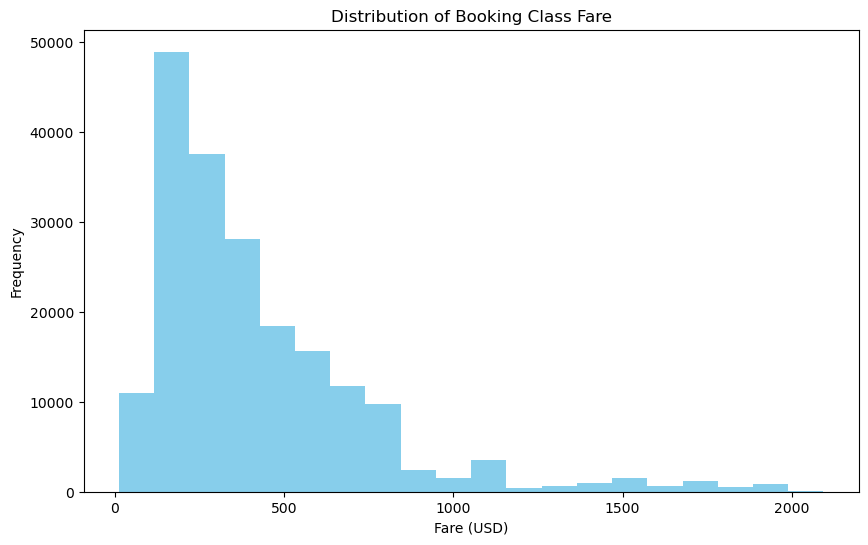

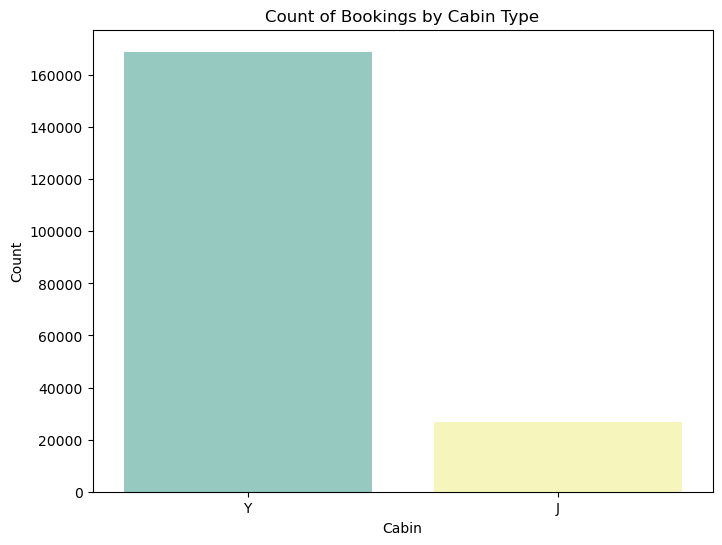

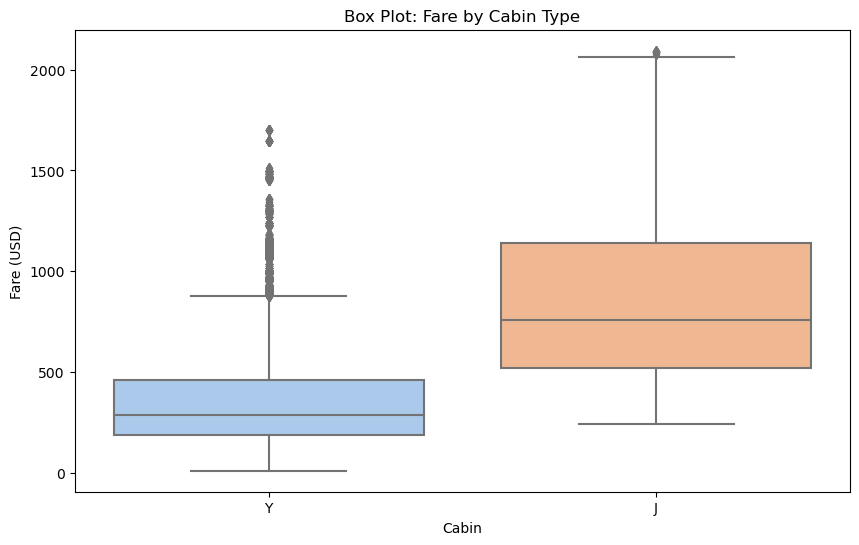

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

df= booking_data

# 1. Histogram for a numerical column (e.g., Booking Class Fare USD)
plt.figure(figsize=(10, 6))
plt.hist(df[' Booking Class Fare USD '], bins=20, color='skyblue')
plt.title('Distribution of Booking Class Fare')
plt.xlabel('Fare (USD)')
plt.ylabel('Frequency')
plt.show()

# 2. Bar chart for categorical data (e.g., Cabin)
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='Cabin', palette='Set3')
plt.title('Count of Bookings by Cabin Type')
plt.xlabel('Cabin')
plt.ylabel('Count')
plt.show()

# 3. Box plot for comparing a numerical column across categories (e.g., Fare by Cabin)
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='Cabin', y=' Booking Class Fare USD ', palette='pastel')
plt.title('Box Plot: Fare by Cabin Type')
plt.xlabel('Cabin')
plt.ylabel('Fare (USD)')
plt.show()

In [36]:
import plotly.express as px

# Calculate the correlation matrix
correlation_matrix = df.corr()

In [37]:

fig = px.imshow(correlation_matrix,
                labels=dict(x="Columns", y="Columns", color="Correlation"),
                x=correlation_matrix.columns,
                y=correlation_matrix.columns,
                color_continuous_scale='Viridis')  # You can choose any other colorscale from the list

fig.update_layout(title='Correlation Heatmap')
plt.figure(figsize=(30, 15))
fig.show()


<Figure size 3000x1500 with 0 Axes>

In [34]:
merged_data = pd.merge(booking_data2, rev_data2, on=[' Origin', ' Destination', 'Flight number', 'Days', 'Dep_time', 'Airline', 'Cabin', 'Booking Class'], how='inner')
print(merged_data.shape)
merged_data.head()

(172647, 743)


,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date_x,Dep_time,Tickets purchased on Day -365,...,Revenue generated on Day -9,Revenue generated on Day -8,Revenue generated on Day -7,Revenue generated on Day -6,Revenue generated on Day -5,Revenue generated on Day -4,Revenue generated on Day -3,Revenue generated on Day -2,Revenue generated on Day -1,Revenue generated on Day 0
0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0
1,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0
2,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,463.65,2318.25,463.65,0.0,0.0,0.0,0.0
3,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0
4,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.0


In [35]:
for i in range(366)[::-1]:
    merged_data[f'Ticket\'s Price on day {-i}'] = merged_data[f'Revenue generated on Day {-i}'] / merged_data[f'Tickets purchased on Day {-i}']
    merged_data.drop([f'Revenue generated on Day {-i}', f'Tickets purchased on Day {-i}'], axis=1, inplace=True)
merged_data.head()

,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date_x,Dep_time,Days,...,Ticket's Price on day -9,Ticket's Price on day -8,Ticket's Price on day -7,Ticket's Price on day -6,Ticket's Price on day -5,Ticket's Price on day -4,Ticket's Price on day -3,Ticket's Price on day -2,Ticket's Price on day -1,Ticket's Price on day 0
0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,463.65,463.65,463.65,NaN,NaN,NaN,NaN
3,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [36]:
merged_data['Ticket\'s Price on day -365'].fillna(0.0, inplace=True)
merged_data.head()

,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date_x,Dep_time,Days,...,Ticket's Price on day -9,Ticket's Price on day -8,Ticket's Price on day -7,Ticket's Price on day -6,Ticket's Price on day -5,Ticket's Price on day -4,Ticket's Price on day -3,Ticket's Price on day -2,Ticket's Price on day -1,Ticket's Price on day 0
0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,463.65,463.65,463.65,NaN,NaN,NaN,NaN
3,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55:00,99,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [41]:
merged_data.replace(-np.inf, np.nan, inplace=True)
merged_data = merged_data.ffill(axis=1)
merged_data.fillna(0.0, inplace=True)
merged_data.head()

,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date_x,Dep_time,Days,...,Ticket's Price on day -9,Ticket's Price on day -8,Ticket's Price on day -7,Ticket's Price on day -6,Ticket's Price on day -5,Ticket's Price on day -4,Ticket's Price on day -3,Ticket's Price on day -2,Ticket's Price on day -1,Ticket's Price on day 0
0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,99,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,99,...,190.92,190.92,190.92,190.92,190.92,190.92,190.92,190.92,190.92,190.92
2,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55:00,99,...,0.0,0.0,0.0,463.65,463.65,463.65,463.65,463.65,463.65,463.65
3,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55:00,99,...,149.83,149.83,149.83,149.83,149.83,149.83,149.83,149.83,149.83,149.83
4,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55:00,99,...,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0,-0.0


In [43]:
schedule_data

,Origin,Destination,Airline,Flight No,sch. Effective Date,sch. Discontinued Date,Dep Time,Arr Time,Flight Duration (mins),Frequency (MTWTFSS),Total_Dept,Seats per Dept,Total Seats,market Share
0,AAA,BBB,DD,801,2023-12-01,2023-12-31,15:55:00,17:50:00,145,1234567,31,186,5766,14.60
1,AAA,BBB,II,906,2023-11-01,2023-11-30,10:30:00,12:30:00,150,1234567,30,176,5280,0.10
2,AAA,BBB,AA,1405,2023-12-04,2023-12-31,18:50:00,20:50:00,150,12345--,20,174,3480,34.60
3,AAA,BBB,HH,1407,2023-11-01,2023-11-30,20:50:00,22:55:00,155,12345--,22,100,2200,37.80
4,AAA,BBB,BB,668,2022-10-17,2022-10-23,20:25:00,22:15:00,140,12345-7,6,174,1044,13.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17064,YYY,CCC,DD,37,2023-07-31,2023-07-31,16:40:00,21:05:00,385,-2-4--7,0,0,0,35.34
17065,YYY,CCC,CC,715,2023-07-31,2023-07-31,10:05:00,14:35:00,390,----5-7,0,0,0,9.85
17066,YYY,CCC,BB,43,2022-11-28,2022-11-30,16:35:00,20:00:00,385,------7,0,0,0,13.10
17067,YYY,CCC,AA,65,2023-01-01,2023-01-01,17:55:00,21:25:00,390,12-456-,0,0,0,21.01


In [44]:
# Calculate the total number of seats
schedule_data['Total Seats'] = schedule_data['Total_Dept'] * schedule_data['Seats per Dept']

In [45]:
market_share=market_data['Market Share']
schedule_data['market Share']=market_share

In [46]:
# Calculate the total seats for each route
total_seats_by_route = schedule_data.groupby(['Origin', 'Destination'])['Total Seats'].transform('sum')

# Calculate the total seats for each route
total_seats_by_route_by_airline = schedule_data.groupby(['Origin', 'Destination','Airline'])['Total Seats'].transform('sum')

# Calculate the market share for each airline on each route
schedule_data['Market Share for each route'] = total_seats_by_route_by_airline / total_seats_by_route

schedule_data['Total Seats by route'] = total_seats_by_route

In [47]:
schedule_data['Market Share for each route']

0        0.138341
1        0.016872
2        0.351708
3        0.437200
4        0.055879
           ...   
17064    0.386111
17065    0.091827
17066    0.168659
17067    0.146886
17068    0.168659
Name: Market Share for each route, Length: 17069, dtype: float64

In [48]:
schedule_data

,Origin,Destination,Airline,Flight No,sch. Effective Date,sch. Discontinued Date,Dep Time,Arr Time,Flight Duration (mins),Frequency (MTWTFSS),Total_Dept,Seats per Dept,Total Seats,market Share,Market Share for each route,Total Seats by route
0,AAA,BBB,DD,801,2023-12-01,2023-12-31,15:55:00,17:50:00,145,1234567,31,186,5766,14.60,0.138341,646770
1,AAA,BBB,II,906,2023-11-01,2023-11-30,10:30:00,12:30:00,150,1234567,30,176,5280,0.10,0.016872,646770
2,AAA,BBB,AA,1405,2023-12-04,2023-12-31,18:50:00,20:50:00,150,12345--,20,174,3480,34.60,0.351708,646770
3,AAA,BBB,HH,1407,2023-11-01,2023-11-30,20:50:00,22:55:00,155,12345--,22,100,2200,37.80,0.437200,646770
4,AAA,BBB,BB,668,2022-10-17,2022-10-23,20:25:00,22:15:00,140,12345-7,6,174,1044,13.00,0.055879,646770
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17064,YYY,CCC,DD,37,2023-07-31,2023-07-31,16:40:00,21:05:00,385,-2-4--7,0,0,0,35.34,0.386111,536620
17065,YYY,CCC,CC,715,2023-07-31,2023-07-31,10:05:00,14:35:00,390,----5-7,0,0,0,9.85,0.091827,536620
17066,YYY,CCC,BB,43,2022-11-28,2022-11-30,16:35:00,20:00:00,385,------7,0,0,0,13.10,0.168659,536620
17067,YYY,CCC,AA,65,2023-01-01,2023-01-01,17:55:00,21:25:00,390,12-456-,0,0,0,21.01,0.146886,536620


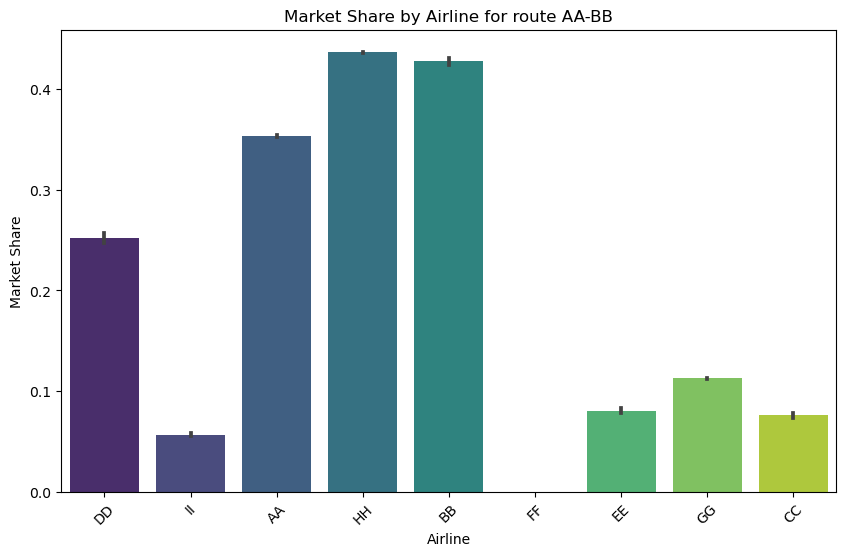

In [48]:
# Bar chart for market share for route AA-BB
plt.figure(figsize=(10, 6))
sns.barplot(data=schedule_data, x='Airline', y='Market Share for each route', palette='viridis')
plt.title('Market Share by Airline for route AA-BB')
plt.xlabel('Airline')
plt.ylabel('Market Share')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

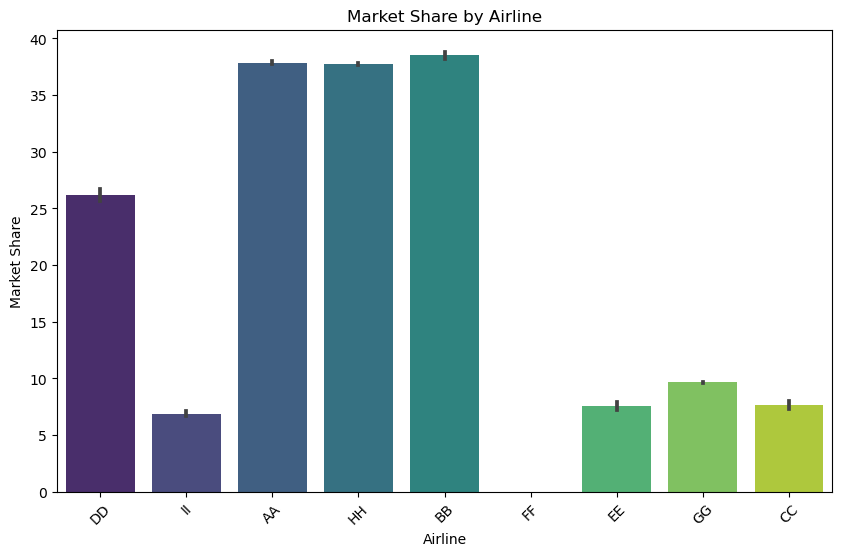

In [49]:
# Bar chart for market share
plt.figure(figsize=(10, 6))
sns.barplot(data=schedule_data, x='Airline', y='market Share', palette='viridis')
plt.title('Market Share by Airline')
plt.xlabel('Airline')
plt.ylabel('Market Share')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility
plt.show()

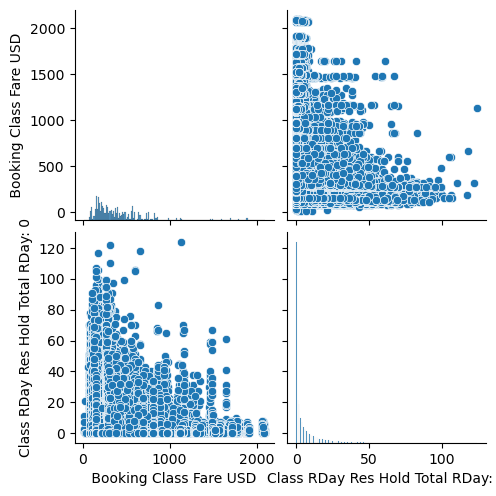

In [50]:
import seaborn as sns
# 7. Pairplot to visualize relationships between numerical columns
sns.pairplot(df[[' Booking Class Fare USD ','Class RDay Res Hold Total RDay: 0']])
plt.show()

In [51]:

# Select the columns you want to visualize
selected_columns = [' Booking Class Fare USD ', 'Class RDay Res Hold Total RDay: 0']

# Create a scatter matrix with Plotly
fig = px.scatter_matrix(df[selected_columns],
                        dimensions=selected_columns,
                        labels={col: col for col in selected_columns},
                        title='Pairplot-Like Visualization')

fig.update_traces(marker=dict(size=3),
                  diagonal_visible=False)

fig.show()


In [49]:
# Rename the columns using a dictionary comprehension
new_column_names = {f'Class RDay Res Hold Total RDay: {365 - i}': f'time_step_{i}' for i in range(366)}

booking_data = booking_data.rename(columns=new_column_names)

In [50]:
booking_data

,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight number,Dep_Date,Dep_time,time_step_0,...,time_step_356,time_step_357,time_step_358,time_step_359,time_step_360,time_step_361,time_step_362,time_step_363,time_step_364,time_step_365
0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
1,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,0.0,1.0,6.0,7.0,7.0,7.0,7.0,7
2,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55:00,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
3,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55:00,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5
4,BBB,DDD,Y,S,90.92,AA,304,2022-04-10,05:55:00,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195769,YYY,CCC,Y,I,262.00,AA,65,2023-09-20,17:45:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195770,YYY,CCC,Y,T,301.27,AA,65,2023-09-20,17:45:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195771,YYY,CCC,Y,M,386.14,AA,65,2023-09-20,17:45:00,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195772,YYY,CCC,Y,H,809.18,AA,65,2023-09-20,17:45:00,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5


In [51]:
# # Define a custom function to modify only "time_step" columns
# def modify_time_step_column(column):
#     if column.name.startswith('time_step_'):
#         return column.apply(lambda x: (x, 365 - int(column.name.split('_')[2])))
#     else:
#         return column

# # Apply the custom function to DataFrame columns
# booking_data = booking_data.apply(modify_time_step_column)

# booking_data


In [52]:
booking_data.rename(columns={'Flight number': 'Flight No','Dep_time':'Dep Time',' Origin':'Origin',' Destination':'Destination'}, inplace=True)

In [53]:
# conda install sklearn

In [54]:
booking_data['O D'] = booking_data['Origin'] + ' ' + booking_data['Destination']
print(booking_data['O D'].unique())

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

booking_data['O D'] = label_encoder.fit_transform(booking_data['O D'])
booking_data.head()

['BBB DDD' 'AAA BBB' 'CCC DDD' 'ZZZ YYY' 'YYY AAA' 'YYY CCC']


,Origin,Destination,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight No,Dep_Date,Dep Time,time_step_0,...,time_step_357,time_step_358,time_step_359,time_step_360,time_step_361,time_step_362,time_step_363,time_step_364,time_step_365,O D
0,BBB,DDD,Y,N,200.01,AA,304,2022-04-10,05:55:00,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10,1
1,BBB,DDD,Y,H,463.65,AA,304,2022-04-10,05:55:00,0.0,...,0.0,0.0,1.0,6.0,7.0,7.0,7.0,7.0,7,1
2,BBB,DDD,Y,G,149.83,AA,304,2022-04-10,05:55:00,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1,1
3,BBB,DDD,Y,T,127.29,AA,304,2022-04-10,05:55:00,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5,1
4,BBB,DDD,Y,S,90.92,AA,304,2022-04-10,05:55:00,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10,1


In [60]:
booking_data.columns

Index(['Origin', 'Destination', 'Cabin', 'Booking Class',
       ' Booking Class Fare USD ', 'Airline', 'Flight No', 'Dep_Date',
       'Dep Time', 'time_step_0',
       ...
       'time_step_357', 'time_step_358', 'time_step_359', 'time_step_360',
       'time_step_361', 'time_step_362', 'time_step_363', 'time_step_364',
       'time_step_365', 'O D'],
      dtype='object', length=376)

In [55]:
booking_data.drop(['Origin','Destination'],inplace=True,axis=1)

In [51]:
booking_data3=booking_data.copy()
booking_data4=booking_data.copy()
booking_data5=booking_data.copy()

In [56]:
booking_data = booking_data[['O D'] + [col for col in booking_data.columns if col != 'O D']]

In [57]:
booking_data

,O D,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight No,Dep_Date,Dep Time,time_step_0,time_step_1,...,time_step_356,time_step_357,time_step_358,time_step_359,time_step_360,time_step_361,time_step_362,time_step_363,time_step_364,time_step_365
0,1,Y,N,200.01,AA,304,2022-04-10,05:55:00,0.0,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
1,1,Y,H,463.65,AA,304,2022-04-10,05:55:00,0.0,0.0,...,0.0,0.0,0.0,1.0,6.0,7.0,7.0,7.0,7.0,7
2,1,Y,G,149.83,AA,304,2022-04-10,05:55:00,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
3,1,Y,T,127.29,AA,304,2022-04-10,05:55:00,0.0,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5
4,1,Y,S,90.92,AA,304,2022-04-10,05:55:00,0.0,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195769,4,Y,I,262.00,AA,65,2023-09-20,17:45:00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195770,4,Y,T,301.27,AA,65,2023-09-20,17:45:00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195771,4,Y,M,386.14,AA,65,2023-09-20,17:45:00,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195772,4,Y,H,809.18,AA,65,2023-09-20,17:45:00,0.0,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5


In [58]:
# Define the column ranges for X_train and Y_train
x_columns = booking_data.columns[0:282]  # Columns from Origin to time_step_273
y_columns = booking_data.columns[282:]   # Columns from time_step_274 to time_step_365

# Create X_train and Y_train
X_train = booking_data[x_columns]
Y_train = booking_data[y_columns]

In [59]:
X_train.columns

Index(['O D', 'Cabin', 'Booking Class', ' Booking Class Fare USD ', 'Airline',
       'Flight No', 'Dep_Date', 'Dep Time', 'time_step_0', 'time_step_1',
       ...
       'time_step_264', 'time_step_265', 'time_step_266', 'time_step_267',
       'time_step_268', 'time_step_269', 'time_step_270', 'time_step_271',
       'time_step_272', 'time_step_273'],
      dtype='object', length=282)

In [81]:


# # Specify the columns to reshape (exclude time step columns)
# columns_to_reshape = ['O D', 'Cabin', 'Booking Class', ' Booking Class Fare USD ', 'Airline', 'Flight No', 'Dep_Date', 'Dep Time']

# # Now, the specified columns have the dimension (1x2)


In [56]:
X_train.shape

(195774, 282)

In [57]:
Y_train.shape

(195774, 92)

In [58]:
Y_train.columns

Index(['time_step_274', 'time_step_275', 'time_step_276', 'time_step_277',
       'time_step_278', 'time_step_279', 'time_step_280', 'time_step_281',
       'time_step_282', 'time_step_283', 'time_step_284', 'time_step_285',
       'time_step_286', 'time_step_287', 'time_step_288', 'time_step_289',
       'time_step_290', 'time_step_291', 'time_step_292', 'time_step_293',
       'time_step_294', 'time_step_295', 'time_step_296', 'time_step_297',
       'time_step_298', 'time_step_299', 'time_step_300', 'time_step_301',
       'time_step_302', 'time_step_303', 'time_step_304', 'time_step_305',
       'time_step_306', 'time_step_307', 'time_step_308', 'time_step_309',
       'time_step_310', 'time_step_311', 'time_step_312', 'time_step_313',
       'time_step_314', 'time_step_315', 'time_step_316', 'time_step_317',
       'time_step_318', 'time_step_319', 'time_step_320', 'time_step_321',
       'time_step_322', 'time_step_323', 'time_step_324', 'time_step_325',
       'time_step_326', '

In [60]:
days = [[], [], [], [], [], [], []]
for day in schedule_data['Frequency (MTWTFSS)']:
    for pos, i in enumerate(day.strip()):
        if i != '-':
            days[(int)(i) - 1].append(1)
        else:
            days[pos].append(0)
            
day_columns = pd.DataFrame(list(map(list, zip(*days))), columns=['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun'])

schedule_data = pd.concat([schedule_data, day_columns], axis=1).drop('Frequency (MTWTFSS)', axis=1)

# MODEL:

In [67]:
booking_data['Booking Class'] = label_encoder.fit_transform(booking_data['Booking Class'])
booking_data['Cabin'] = label_encoder.fit_transform(booking_data['Cabin'])
booking_data.drop(['Dep_Date'],inplace=True,axis=1)
booking_data.head()

,O D,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight No,time_step_0,time_step_1,time_step_2,time_step_3,...,time_step_356,time_step_357,time_step_358,time_step_359,time_step_360,time_step_361,time_step_362,time_step_363,time_step_364,time_step_365
0,1,1,13,200.01,AA,304,0.0,0.0,0.0,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
1,1,1,7,463.65,AA,304,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,6.0,7.0,7.0,7.0,7.0,7
2,1,1,6,149.83,AA,304,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
3,1,1,19,127.29,AA,304,0.0,0.0,0.0,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5
4,1,1,18,90.92,AA,304,0.0,0.0,0.0,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10


In [ ]:
booking_data.drop(['Dep Time'],inplace=True,axis=1)
revenue_data.drop(['Airline'],inplace=True,axis=1)

In [74]:
booking_data.head()

,O D,Cabin,Booking Class,Booking Class Fare USD,Airline,Flight No,time_step_0,time_step_1,time_step_2,time_step_3,...,time_step_356,time_step_357,time_step_358,time_step_359,time_step_360,time_step_361,time_step_362,time_step_363,time_step_364,time_step_365
0,1,1,13,200.01,AA,304,0.0,0.0,0.0,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
1,1,1,7,463.65,AA,304,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,6.0,7.0,7.0,7.0,7.0,7
2,1,1,6,149.83,AA,304,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
3,1,1,19,127.29,AA,304,0.0,0.0,0.0,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5
4,1,1,18,90.92,AA,304,0.0,0.0,0.0,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10


In [75]:
rem_col = []
for i in range(274, 366):
    rem_col.append(f'time_step_{i}')

X_train = booking_data.drop(rem_col, axis=1)

In [78]:
X_train.drop(['Airline'], axis=1, inplace=True)

In [76]:
Y_train

,time_step_274,time_step_275,time_step_276,time_step_277,time_step_278,time_step_279,time_step_280,time_step_281,time_step_282,time_step_283,...,time_step_356,time_step_357,time_step_358,time_step_359,time_step_360,time_step_361,time_step_362,time_step_363,time_step_364,time_step_365
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,6.0,7.0,7.0,7.0,7.0,7
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5
4,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,...,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10.0,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
195769,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195770,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195771,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
195772,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5


In [79]:
import tensorflow as tf

# Assuming you have NumPy arrays X_train and Y_train
X_train_tensor = tf.convert_to_tensor(X_train, dtype=tf.float32)
Y_train_tensor = tf.convert_to_tensor(Y_train, dtype=tf.float32)

In [82]:
X_train_tensor = tf.reshape(X_train_tensor, (195774, -1, 1))
Y_train_tensor = tf.reshape(Y_train_tensor, (195774, -1, 1))

## Revenue Model

In [84]:
revenue_data

,Origin,Destination,Cabin,Booking Class,Airline,Flight number,Dep_Date,Dep_time,Class RDay Rev RDay: 365,Class RDay Rev RDay: 364,...,Class RDay Rev RDay: 9,Class RDay Rev RDay: 8,Class RDay Rev RDay: 7,Class RDay Rev RDay: 6,Class RDay Rev RDay: 5,Class RDay Rev RDay: 4,Class RDay Rev RDay: 3,Class RDay Rev RDay: 2,Class RDay Rev RDay: 1,Class RDay Rev RDay: 0
0,BBB,DDD,Y,N,AA,304,2022-04-10,05:55:00,0.0,0.0,...,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20
1,BBB,DDD,Y,T,AA,304,2022-04-10,05:55:00,0.0,0.0,...,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57
2,BBB,DDD,Y,E,AA,304,2022-04-10,05:55:00,0.0,0.0,...,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33
3,BBB,DDD,J,D,AA,304,2022-04-10,05:55:00,0.0,0.0,...,630.54,630.54,630.54,630.54,945.81,945.81,945.81,945.81,945.81,945.81
4,BBB,DDD,Y,V,AA,304,2022-04-10,05:55:00,0.0,0.0,...,297.36,297.36,297.36,297.36,297.36,297.36,297.36,297.36,446.04,446.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
191707,YYY,CCC,Y,Q,AA,65,2023-09-20,17:45:00,0.0,0.0,...,287.11,287.11,288.12,286.92,287.06,287.06,286.69,286.69,286.69,286.32
191708,YYY,CCC,J,C,AA,65,2023-09-20,17:45:00,0.0,0.0,...,1155.06,1155.06,1158.16,1154.46,1154.92,1154.92,1153.75,1153.75,1153.75,1153.93
191709,YYY,CCC,Y,V,AA,65,2023-09-20,17:45:00,0.0,0.0,...,336.46,336.46,337.52,336.25,336.41,336.41,336.01,336.01,336.01,339.34
191710,YYY,CCC,Y,N,AA,65,2023-09-20,17:45:00,0.0,0.0,...,1373.48,1373.48,1378.32,1372.56,1373.28,1373.28,1371.44,1371.44,1371.44,1387.48


In [86]:
revenue_data['O D'] = revenue_data[' Origin'] + ' ' + revenue_data[' Destination']
print(revenue_data['O D'].unique())

from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()

revenue_data['O D'] = label_encoder.fit_transform(revenue_data['O D'])
revenue_data.head()

['BBB DDD' 'AAA BBB' 'CCC DDD' 'ZZZ YYY' 'YYY AAA' 'YYY CCC']


,Origin,Destination,Cabin,Booking Class,Airline,Flight number,Dep_Date,Dep_time,Class RDay Rev RDay: 365,Class RDay Rev RDay: 364,...,Class RDay Rev RDay: 8,Class RDay Rev RDay: 7,Class RDay Rev RDay: 6,Class RDay Rev RDay: 5,Class RDay Rev RDay: 4,Class RDay Rev RDay: 3,Class RDay Rev RDay: 2,Class RDay Rev RDay: 1,Class RDay Rev RDay: 0,O D
0,BBB,DDD,Y,N,AA,304,2022-04-10,05:55:00,0.0,0.0,...,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20,323.20,1
1,BBB,DDD,Y,T,AA,304,2022-04-10,05:55:00,0.0,0.0,...,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57,357.57,1
2,BBB,DDD,Y,E,AA,304,2022-04-10,05:55:00,0.0,0.0,...,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33,187.33,1
3,BBB,DDD,J,D,AA,304,2022-04-10,05:55:00,0.0,0.0,...,630.54,630.54,630.54,945.81,945.81,945.81,945.81,945.81,945.81,1
4,BBB,DDD,Y,V,AA,304,2022-04-10,05:55:00,0.0,0.0,...,297.36,297.36,297.36,297.36,297.36,297.36,297.36,446.04,446.04,1


In [87]:
revenue_data['Booking Class'] = label_encoder.fit_transform(revenue_data['Booking Class'])

In [88]:
revenue_data['Cabin'] = label_encoder.fit_transform(revenue_data['Cabin'])

In [89]:
revenue_data = revenue_data[['O D'] + [col for col in revenue_data.columns if col != 'O D']]

In [90]:
revenue_data.drop(['Dep_Date'],inplace=True,axis=1)

In [91]:
revenue_data.drop(['Dep_time'],inplace=True,axis=1)

In [93]:
revenue_data.drop([' Origin',' Destination'],inplace=True,axis=1)

In [96]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

scaled_rev_data = scaler.fit_transform(revenue_data)


In [97]:
# Define the column ranges for X_train and Y_train
x_columns = scaled_rev_data[:, 0:278]  # Columns from Origin to time_step_273
y_columns = scaled_rev_data[:, 278:]   # Columns from time_step_274 to time_step_365

# Create X_train and Y_train
X_train = x_columns
Y_train = y_columns


In [77]:
Y_train

array([[0.        , 0.        , 0.        , ..., 0.00230242, 0.002284  ,
        0.00230242],
       [0.        , 0.        , 0.        , ..., 0.00254726, 0.00252688,
        0.00254726],
       [0.        , 0.        , 0.        , ..., 0.0013345 , 0.00132383,
        0.0013345 ],
       ...,
       [0.        , 0.        , 0.        , ..., 0.00239367, 0.00237452,
        0.0024174 ],
       [0.01639039, 0.01639039, 0.01639039, ..., 0.00976989, 0.00969173,
        0.00988415],
       [0.        , 0.        , 0.        , ..., 0.00353897, 0.00351066,
        0.00357915]])

In [78]:
Y_train.shape

(191712, 93)

In [79]:
X_train[:1]

array([[0.2      , 1.       , 0.5      , 0.       , 0.0252296, 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.       , 0.       , 0.       , 0.       ,
        0.       , 0.       , 0.      

In [80]:
import tensorflow as tf

# Assuming you have NumPy arrays X_train and Y_train
X_train_tensor = tf.convert_to_tensor(X_train, dtype=tf.float32)
Y_train_tensor = tf.convert_to_tensor(Y_train, dtype=tf.float32)


In [81]:
import tensorflow as tf

# Assuming X_train_tensor has shape (191721, 278)
X_train_tensor = tf.reshape(X_train_tensor, (191712, 278, 1))
# Now X_train_tensor has shape (191721, 278, 1)
Y_train_tensor = tf.reshape(Y_train_tensor, (191712, 93, 1))

In [98]:
X_train_tensor = np.expand_dims(X_train, axis=2)
Y_train_tensor = np.expand_dims(Y_train, axis=2)

In [110]:
def log_mse(yhat, y):
    return tf.math.log(tf.reduce_sum((yhat - y)**2))

In [ ]:
import math

input_seq_length = 278
output_seq_length = 92

# Define the model
model = tf.keras.Sequential()

# Encoder
model.add(tf.keras.layers.LSTM(1, input_shape=(input_seq_length, 1), return_sequences=False))
model.add(tf.keras.layers.Dropout(0.5))  # Add dropout with a rate of 0.5
model.add(tf.keras.layers.RepeatVector(output_seq_length))

# Decoder   
model.add(tf.keras.layers.LSTM(1, return_sequences=True))
model.add(tf.keras.layers.Dropout(0.5))  # Add dropout with a rate of 0.5
model.add(tf.keras.layers.TimeDistributed(tf.keras.layers.Dense(1)))

# Compile the model
model.compile(loss=log_mse,
              optimizer='adam', 
              metrics=['accuracy'])

# Assuming you have X_train_tensor and Y_train_tensor with appropriate shapes
# Train the model using your dataset
model.fit(X_train_tensor, Y_train_tensor, epochs=100, batch_size=100)  # You can adjust batch_size and epochs as needed


Epoch 1/100
1918/1918 [==============================] - 277s 140ms/step - loss: 1.4598 - accuracy: 0.5380
Epoch 2/100
1200/1918 [=================>............] - ETA: 1:43 - loss: 1.2448 - accuracy: 0.5371

## Extra Codes:

In [ ]:
# Encoding categorical variables if needed
booking_data = pd.get_dummies(booking_data, columns=['Cabin', 'Booking Class'])

# Encoding categorical variables if needed
revenue_data = pd.get_dummies(revenue_data, columns=['Cabin', 'Booking Class'])

# Encoding categorical variables if needed
schedule_data = pd.get_dummies(schedule_data, columns=['Airline'])